In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
file_preproc = "/home/icb/raphael.kfuri-rubens/data/yumm_analysis/anndata_files/immunity_dc_revision_qc_filtered.h5ad"
adata = sc.read(file_preproc)

In [3]:
for res in [0.05, 0.1, 0.5, 1, 2.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

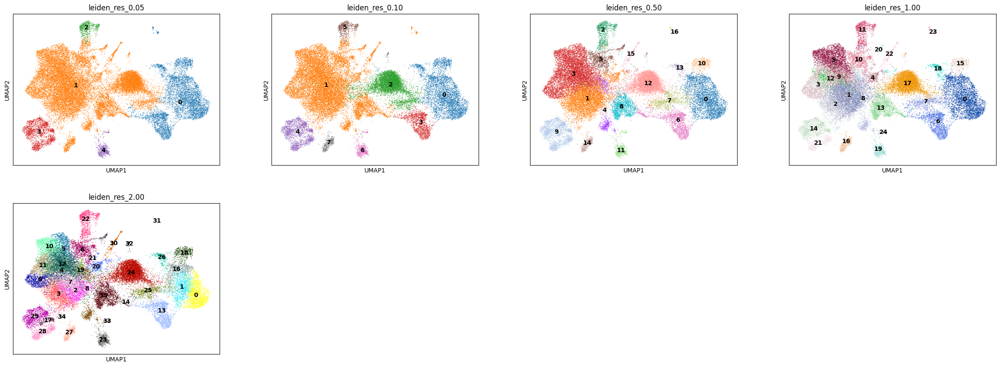

In [9]:
sc.pl.umap(
    adata,
    color=["leiden_res_0.05", "leiden_res_0.10", "leiden_res_0.50", "leiden_res_1.00", "leiden_res_2.00"],
    legend_loc="on data",
)

In [ ]:
cell_markers = {
    'Immune ': ['Ptprc'],
    'All T cells': ['Cd3e', 'Cd3d', 'Cd28', 'Cd5', 'Bcl11b'],
    'All CD8 ': ['Cd8a'],
    'CD8 naïve': ['Cd45ra', 'Lef1'],
    'CD8 stem like': ['Tcf7', 'Slamf6', 'Xcl1', 'Pdcd1'],
    'CD8 T Effector': [
        'Gzmb', 'Havcr2', 'Tbx21', 'Prf1', 'Klrd1',
        'Ifng', 'Emos', 'Gzmk'
    ],
    'CD8 T Memory': ['Nsg2', 'Tcf7', 'Cd44', 'Cd28'],
    'CD8 exhausted': ['Cd101', 'Cd200r1', 'Cd244', 'Tigit', 'Havcr2'],
    'All CD4 ': ['Cd4'],
    'CD4 naïve': ['Tcf7', 'Lef1'],
    'CD4 T Regulatory': ['Foxp3', 'Il2ra', 'Ctla4', 'Il10', 'Folr4'],
    'CD4 T helper 1': ['Cxcr3', 'Ccl5', 'Ms4a4b', 'Tbx21'],
    'CD4 T helper 2': [
        'Il1rl1', 'Gata3', 'Il13', 'Il5', 'Il17rb', 'Ltb4r1', 'Ccr8',
        'Il4', 'Pparg'
    ],
    'CD4 T helper 17': ['Il17c', 'Il17a'],
    'Cytotoxic CD4': ['Gzmb', 'Gzmh', 'Prf1', 'Tbx21'],
    'NK': ['Ncr1', 'Nkg7', 'Prf1', 'Ctsw'],
    'Mast cells/Basophils (not clean markers)': [
        'Cpa3', 'Cd247', 'Ccnd2', 'Cd96'
    ],
    'B cells': ['Cd79a', 'Cd19'],
    'All cDCs': ['Cd11c', 'Flt3'],
    'cDC1 ': ['Xcr1', 'Clec9a', 'Batf3', 'Rab7b', 'Cadm1', 'Tbhd'],
    'cDC2': [
        'Cd209a', 'Cd1c', 'Cd1e', 'Cd1a', 'Fcer1a', 'Tnfsf12', 'Cebpb',
        'Cd207', 'Itgam', 'Sirpa'
    ],
    'cDC1 and cDC2 ': ['Clec9a', 'Cd209a'],
    'DC3 ': [
        'Ccr7', 'Fscn1', 'Lamp3', 'Il12b', 'Ccl22', 'Marcksl1', 'Cd274',
        'Stat4', 'Sema7a', 'Pdcd1lg2', 'Cd200', 'Cd40', 'Socs2', 'Relb',
        'Cd83', 'Cd40', 'Tnfsf4'
    ],
    'pDC': [
        'Siglech', 'Tcf4', 'Bcl11a', 'Pld4', 'Runx2', 'Tspan13',
        'Pacsin1', 'Gpm6b', 'Nucb2,'
    ],
    'Mono-like DC': [
        'Itgam', 'Itgax', 'Cd14', 'Sirpa', 'Cd209a', 'Cd1c', 'Cd36',
        'Fcgr1', 'Cd83', 'H2-Aa', 'Cd86', 'Flt3'
    ],
    'All Macrophages ': [
        'Mrc1', 'Apoe', 'C1qa', 'C1qb', 'C1qc', 'Ctsb', 'Ctsd'
    ],
    'Macrophage 1': ['Ccl17', 'Ccr5', 'Mafb', 'Ciqb', 'Cd86'],
    'Macrophage 2': ['Fabp5', 'Spp1', 'Cd68', 'Gpnmb'],
    'Macrophage 3': ['Alox15', 'Saa3', 'Prg4', 'Serpinb2'],
    'Macrophage 4': ['Krt79', 'Chil3', 'Car4', 'Krt19', 'Marco'],
    'All Neutrophils': [
        'Adam8', 'S100a9', 'S100a8', 'Csf3r', 'Lrg1', 'Ffar2', 'Vasp',
        'Mmp8', 'Mmp9'
    ],
    'Pro-tumorigenic Neutrophils': [
        'Siglecf', 'Cstb', 'Ccl3', 'Car4', 'Clec4n', 'Clec5a', 'Csf1',
        'Ltc4s', 'Nt5e', 'Runx1', 'Spp1', 'Vegfa', 'Xbp1'
    ],
    'Proliferation': ['Mki67'],
    'Non-immune': ['Postn'],
    'Fibroblast/CAF': ['Col1a1', 'Acta2', 'Col1a2', 'Col3a1'],
    'Endothelial cells ': ['Eng', 'Pecam1', 'Tm4sf1', 'Sele'],
    'Tumor endothelial cells': ['Ackr1', 'Plvap', 'Igfbp3'],
    'Lymphatic EC': ['Ccl19', 'Lyve1'],
    'Smooth muscle cells (not specific markers)': ['Tagln', 'Acta2', 'Tpm2'],
    'Monocytes': ['Plac8', 'Ace', 'S100a9', 'S100a8', 'Cst3r', 'Ptgs2', 'Itgal'],
    'Additions': ['Folr2', 'Lyve1', 'Cd163', 'Mki67', 'Stmn1', 'Pclaf', 'Top2a',
                  'Tuba1b', 'Hmgb2', 'Trem2', 'Arg1', 'Lars2', 'Ace'],
    'IFN TAM': ["Cxcl9", "Cxcl10", "Cxcl11", "Ifit1", "Ifit2", "Ifit3",
                "Isg15", "Nos2", "Tnfsf10", "Ido1"],
    'INFLAM-TAM': ["Cxcl1", "Cxcl2", "Cxcl3", "Cxcl5", "Cxcl8", "Ccl20",
                   "Ccl3l1", "Il1rn", "Il1b", "G0s2"],
    'Reg TAM': ["Apoe", "Arg1", "C1qa", "Ccl2", "Cd63", "Cx3cr1", "Trem2"],
    'Monocytes Mauro': ["Plac8", "Ly6c2", "Srgn", "Cd14", "Lyz2", "Thbs1"]
}


In [5]:
tam_marker_genes = {
    "IFN-TAMs": [
        "Ccl2", "Ccl7", "Ccl8", "Cd274", "Cxcl9", "Cxcl10", "Cxcl11",
        "Ifit1", "Ifit2", "Ifit3", "Ifitm1", "Ifitm3", "Il7r", "Isg15", 
        "Nos2", "Rsad2", "Tnfsf10", "Stat1"
    ],
    "Inflam-TAMs": [
        "Cxcl1", "Cxcl2", "Cxcl3", "Cxcl5", "Cxcl8", "Ccl20", "Ccl3l1",
        "Il1rn", "Il1b", "G0s2", "Inhba", "Spp1"
    ],
    "LA-TAMs": [
        "Acp5", "Apoc1", "Apoe", "C1qa", "C1qb", "C1qc", "Ccl18", 
        "Ccl8", "Cd163", "Cd206", "Cd36", "Cd63", "Ctsb", "Ctsd", 
        "Ctsl", "Cxcl9", "Fabp5", "Folr2", "Gpnmb", "Lgals3", "Macro", 
        "Mrc1", "Trem2"
    ],
    "Angio-TAMs": [
        "Arg1", "Adam8", "Bnip3", "Mif", "Slc2a1"
    ],
    "Reg-TAMs": [
        "Apoe", "Arg1", "C1qa", "Ccl2", "Cd63", "Clec4d", "Cx3cr1",
        "Gpnmb", "Hilpda", "Hmox1", "Il7r", "Mrc1", "Pf4", "Spp1", 
        "Trem2", "Vegfa", "Itga4"
    ],
    "Prolif-TAMs": [
        "Cdk1", "Mki67", "Stmn1", "Top2a", "Tubb"
    ],
    "Classical TIMs": [
        "Ccl2", "Ccl9", "Ccr2", "Cd14", "Cd300lf", "Cxcl10", "F13a1",
        "Fcn1", "Fn1", "Ifi205", "Ifit2", "Ifit3", "Il1r2", "Isg20",
        "Itga4", "Ly6c2", "Lyz", "Mgst1", "Plaur", "S100a8", "S100a9", 
        "S100a12", "Sell", "Tgm2", "Thbs1", "Tlr2", "Vcan"
    ],
    "Nonclassical monocytes": [
        "Ace", "Adgre4", "Cd300a", "Cdkn1c", "Ceacam1", "Ear2", 
        "Il17ra", "Itgal", "Lilrb2", "Lrp1", "Spn", "Stk10", 
        "Tnfrsf1b", "Treml4"
    ],
    "Alveolar RTM-like TAMs": [
        "Krt79", "Krt19", "Car4"
    ],
    "Microglia-like RTM TAMs": [
        "Bin1", "Cst7", "Cxcl13", "Hexb", "Nav3", "P2ry12", "Sall1", 
        "Siglech", "Sparc"
    ]
}


In [ ]:
monocytes_marker_genes = {
    "Classical": [
        "Ly6c2", "Cd44", "Cd43", "Itgam", "Csf1r",
        "Sell", "Ccr2", "Cxcr1", "Tnf" 
    ],
    "Intermediate": [
        "Ly6c2", "Cd44", "Cd43", "Itgam", "Csf1r", "Il1b"
    ],
    "Nonclassical": [
        "Ly6c2", "Cd44", "Cd43", "Itgam", "Csf1r", 
        "Itgax", "Cx3cr1", "Il1rn"
    ]
}

In [ ]:
remove_genes = [
    'Ccl20', 'Ccl3l1', 'Cd11c', 'Cd1a', 'Cd1c', 'Cd1e', 'Cd244',
    'Cd45ra', 'Ciqb', 'Cst3r', 'Cxcl8', 'Emos', 'Folr4', 'Gzmh', 
    'Nucb2,', 'Tbhd'
]

cell_markers_dict_dotplot = cell_markers.copy()

for cell_type, markers in cell_markers_dict_dotplot.items():
    cell_markers_dict_dotplot[cell_type] = [gene for gene in markers if gene not in remove_genes]

cell_markers_dict_dotplot

{'Immune ': ['Ptprc'],
 'All T cells': ['Cd3e', 'Cd3d', 'Cd28', 'Cd5', 'Bcl11b'],
 'All CD8 ': ['Cd8a'],
 'CD8 naïve': ['Lef1'],
 'CD8 stem like': ['Tcf7', 'Slamf6', 'Xcl1', 'Pdcd1'],
 'CD8 T Effector': ['Gzmb',
  'Havcr2',
  'Tbx21',
  'Prf1',
  'Klrd1',
  'Ifng',
  'Gzmk'],
 'CD8 T Memory': ['Nsg2', 'Tcf7', 'Cd44', 'Cd28'],
 'CD8 exhausted': ['Cd101', 'Cd200r1', 'Tigit', 'Havcr2'],
 'All CD4 ': ['Cd4'],
 'CD4 naïve': ['Tcf7', 'Lef1'],
 'CD4 T Regulatory': ['Foxp3', 'Il2ra', 'Ctla4', 'Il10'],
 'CD4 T helper 1': ['Cxcr3', 'Ccl5', 'Ms4a4b', 'Tbx21'],
 'CD4 T helper 2': ['Il1rl1',
  'Gata3',
  'Il13',
  'Il5',
  'Il17rb',
  'Ltb4r1',
  'Ccr8',
  'Il4',
  'Pparg'],
 'CD4 T helper 17': ['Il17c', 'Il17a'],
 'Cytotoxic CD4': ['Gzmb', 'Prf1', 'Tbx21'],
 'NK': ['Ncr1', 'Nkg7', 'Prf1', 'Ctsw'],
 'Mast cells/Basophils (not clean markers)': ['Cpa3',
  'Cd247',
  'Ccnd2',
  'Cd96'],
 'B cells': ['Cd79a', 'Cd19'],
 'All cDCs': ['Flt3'],
 'cDC1 ': ['Xcr1', 'Clec9a', 'Batf3', 'Rab7b', 'Cadm1'],
 'cDC

In [ ]:
remove_tam_genes = [
    'Ccl18', 'Ccl20', 'Ccl3l1', 'Cd206', 'Cxcl8', 'Fcn1',
    'Lilrb2', 'Lyz', 'Macro', 'S100a12', 'Tubb'
]

tam_marker_genes_dict_dotplot = tam_marker_genes.copy()

for cell_type, markers in tam_marker_genes_dict_dotplot.items():
    tam_marker_genes_dict_dotplot[cell_type] = [gene for gene in markers if gene not in remove_tam_genes]

tam_marker_genes_dict_dotplot

{'IFN-TAMs': ['Ccl2',
  'Ccl7',
  'Ccl8',
  'Cd274',
  'Cxcl9',
  'Cxcl10',
  'Cxcl11',
  'Ifit1',
  'Ifit2',
  'Ifit3',
  'Ifitm1',
  'Ifitm3',
  'Il7r',
  'Isg15',
  'Nos2',
  'Rsad2',
  'Tnfsf10',
  'Stat1'],
 'Inflam-TAMs': ['Cxcl1',
  'Cxcl2',
  'Cxcl3',
  'Cxcl5',
  'Il1rn',
  'Il1b',
  'G0s2',
  'Inhba',
  'Spp1'],
 'LA-TAMs': ['Acp5',
  'Apoc1',
  'Apoe',
  'C1qa',
  'C1qb',
  'C1qc',
  'Ccl8',
  'Cd163',
  'Cd36',
  'Cd63',
  'Ctsb',
  'Ctsd',
  'Ctsl',
  'Cxcl9',
  'Fabp5',
  'Folr2',
  'Gpnmb',
  'Lgals3',
  'Mrc1',
  'Trem2'],
 'Angio-TAMs': ['Arg1', 'Adam8', 'Bnip3', 'Mif', 'Slc2a1'],
 'Reg-TAMs': ['Apoe',
  'Arg1',
  'C1qa',
  'Ccl2',
  'Cd63',
  'Clec4d',
  'Cx3cr1',
  'Gpnmb',
  'Hilpda',
  'Hmox1',
  'Il7r',
  'Mrc1',
  'Pf4',
  'Spp1',
  'Trem2',
  'Vegfa',
  'Itga4'],
 'Prolif-TAMs': ['Cdk1', 'Mki67', 'Stmn1', 'Top2a'],
 'Classical TIMs': ['Ccl2',
  'Ccl9',
  'Ccr2',
  'Cd14',
  'Cd300lf',
  'Cxcl10',
  'F13a1',
  'Fn1',
  'Ifi205',
  'Ifit2',
  'Ifit3',
  'Il1r2',
 

In [9]:
remove_monocyte_genes = ['Cd43']

monocytes_marker_genes_dict_dotplot = monocytes_marker_genes.copy()

for cell_type, markers in monocytes_marker_genes_dict_dotplot.items():
    monocytes_marker_genes_dict_dotplot[cell_type] = [gene for gene in markers if gene not in remove_monocyte_genes]

monocytes_marker_genes_dict_dotplot

{'Classical': ['Ly6c2',
  'Cd44',
  'Itgam',
  'Csf1r',
  'Sell',
  'Ccr2',
  'Cxcr1',
  'Tnf'],
 'Intermediate': ['Ly6c2', 'Cd44', 'Itgam', 'Csf1r', 'Il1b'],
 'Nonclassical': ['Ly6c2',
  'Cd44',
  'Itgam',
  'Csf1r',
  'Itgax',
  'Cx3cr1',
  'Il1rn']}

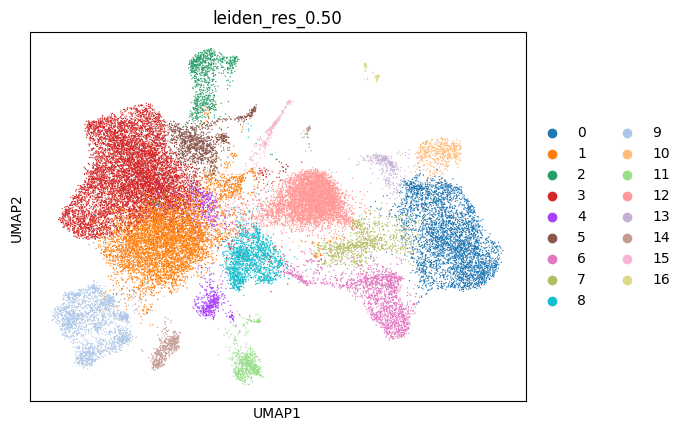

In [13]:
sc.pl.umap(
    adata,
    color=["leiden_res_0.50"]
)

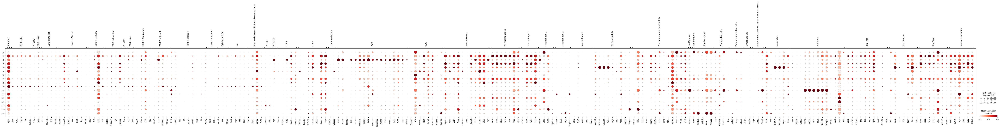

In [12]:
sc.pl.dotplot(adata, cell_markers_dict_dotplot, groupby="leiden_res_0.50", standard_scale="var")

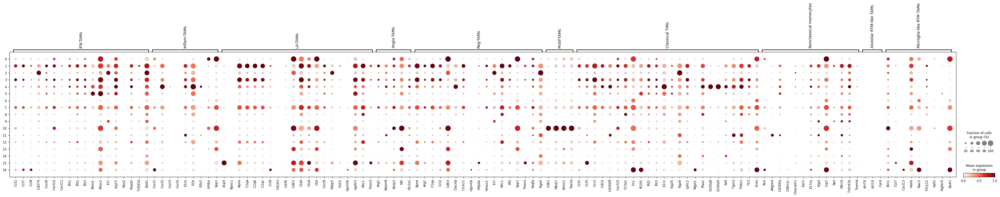

In [19]:
sc.pl.dotplot(adata, tam_marker_genes_dict_dotplot, groupby="leiden_res_0.50", standard_scale="var")

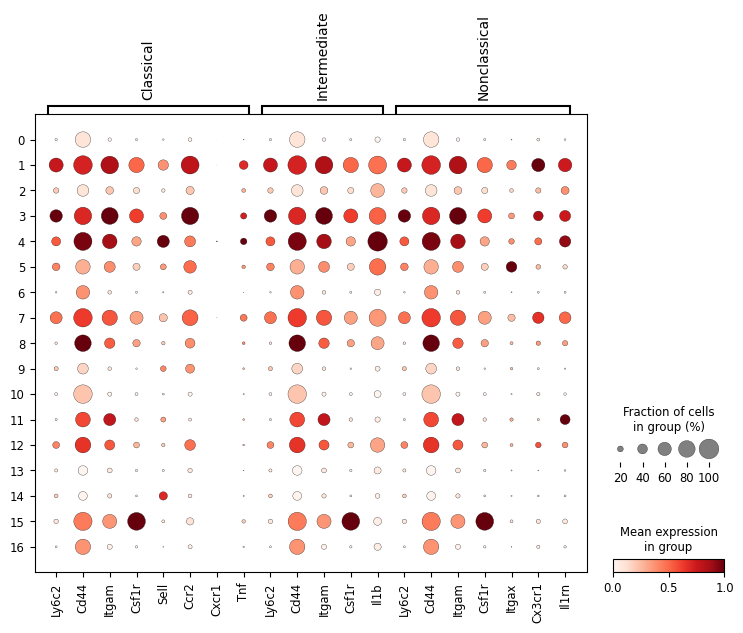

In [24]:
sc.pl.dotplot(adata, monocytes_marker_genes_dict_dotplot, groupby="leiden_res_0.50", standard_scale="var")

# From clusters to cell types/marker genes

In [25]:
sc.tl.rank_genes_groups(adata, groupby="leiden_res_0.50", method="wilcoxon")

In [26]:
gene_groups = sc.get.rank_genes_groups_df(adata, group = None)
gene_groups

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,Mgp,88.555443,5.631329,0.000000e+00,0.000000e+00
1,0,Sparc,87.897400,4.264840,0.000000e+00,0.000000e+00
2,0,Crabp1,87.483376,5.213086,0.000000e+00,0.000000e+00
3,0,Bgn,87.198204,4.366757,0.000000e+00,0.000000e+00
4,0,Cald1,86.146484,3.992167,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...
402487,16,Actb,-8.433398,-1.871181,3.357697e-17,9.243819e-15
402488,16,Dock2,-8.528615,-2.983206,1.481104e-17,4.329212e-15
402489,16,Ctss,-8.548029,-3.240044,1.252087e-17,3.752457e-15
402490,16,Lyn,-8.585783,-3.294897,9.021969e-18,2.774080e-15


In [ ]:
gene_groups_subset = gene_groups.groupby("group").head(100)
gene_groups_subset

/tmp/ipykernel_1135823/2217264941.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  gene_groups_subset = gene_groups.groupby("group").head(100)


,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,Mgp,88.555443,5.631329,0.000000e+00,0.000000e+00
1,0,Sparc,87.897400,4.264840,0.000000e+00,0.000000e+00
2,0,Crabp1,87.483376,5.213086,0.000000e+00,0.000000e+00
3,0,Bgn,87.198204,4.366757,0.000000e+00,0.000000e+00
4,0,Cald1,86.146484,3.992167,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...
378911,16,Prrx1,8.037531,2.423706,9.166696e-16,2.086834e-13
378912,16,Pam,8.025026,2.630965,1.015039e-15,2.288767e-13
378913,16,Nfib,7.997771,2.285652,1.266919e-15,2.829770e-13
378914,16,Ifi205,7.961236,2.806173,1.703291e-15,3.768890e-13


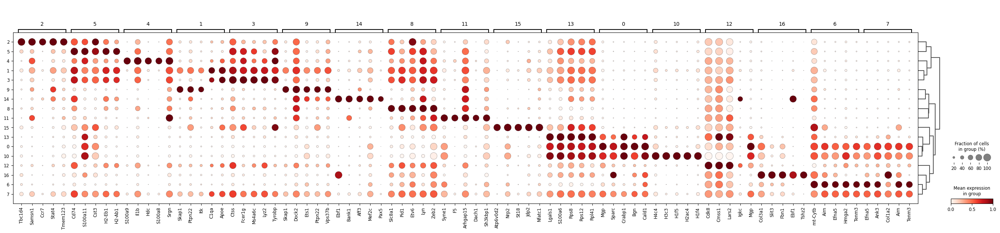

In [29]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_res_0.50", standard_scale="var", n_genes=5
)

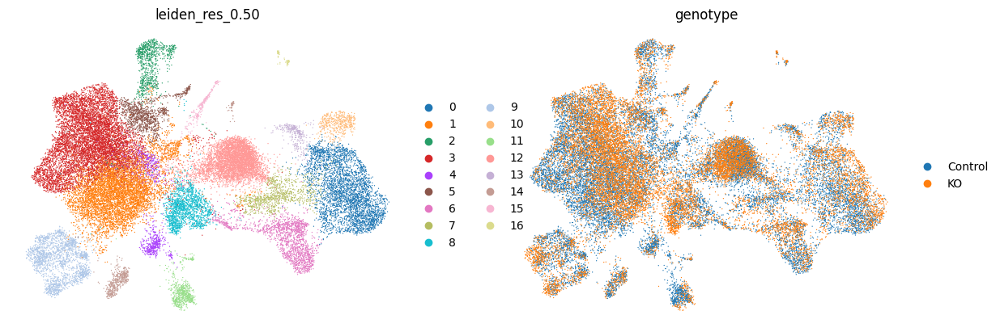

In [31]:
sc.pl.umap(
    adata,
    color=["leiden_res_0.50", "genotype"],
    frameon=False
)

In [119]:
annotation_v1_subannot = {
    "0": "YUMM cells/CAFs",
    "1": "Myeloid",
    "2": "Myeloid",
    "3": "Myeloid",
    "4": "Neutrophils",
    "5": "Myeloid",
    "6": "YUMM cells/CAFs",
    "7": "YUMM cells/CAFs",
    "8": "T/NK",
    "9": "T/NK",
    "10": "YUMM cells/CAFs",
    "11": "Myeloid",
    "12": "Plasma cells",
    "13": "YUMM cells/CAFs",
    "14": "B cells",
    "15": "Osteoclast-like cells",
    "16": "YUMM cells/CAFs"
}


adata.obs['annotation_v1_subannot'] = adata.obs['leiden_res_0.50'].map(annotation_v1_subannot)

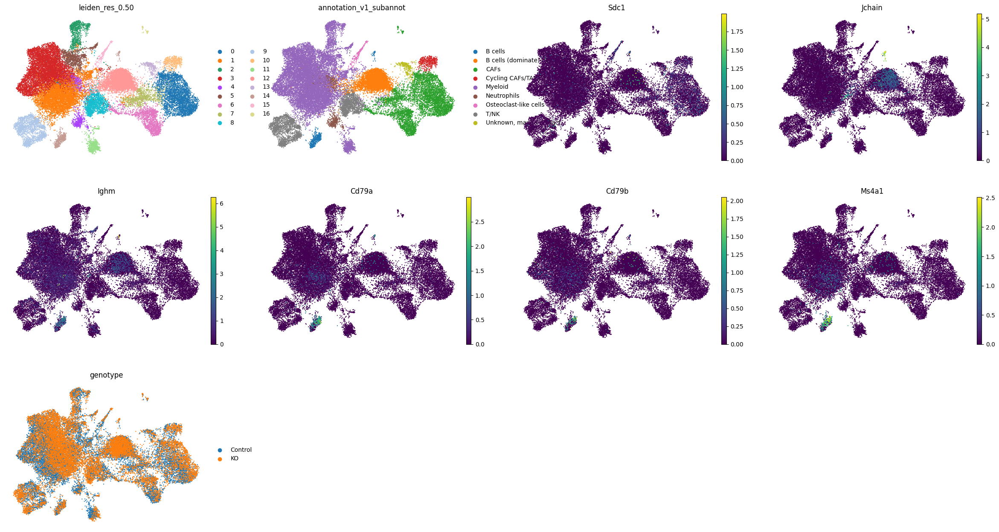

In [ ]:
sc.pl.umap(
    adata,
    color=[
        "leiden_res_0.50", "annotation_v1_subannot", "Sdc1",
        "Jchain", "Ighm", "Cd79a", "Cd79b", "Ms4a1", "genotype"
    ],
    frameon=False,
    size=10
)

# Annotate T/NK more in detail

In [12]:
adata_t_nk = adata[adata.obs["annotation_v1_subannot"] == "T/NK"].copy()
adata_t_nk.obs["annotation_v1_subannot"] = adata_t_nk.obs["annotation_v1_subannot"].astype("category")
adata_t_nk

AnnData object with n_obs × n_vars = 3669 × 23676
    obs: 'library_id', 'sample_id', 'genotype', 'n_genes', 'doublet_score', 'predicted_doublet', 'n_counts', 'log1p_n_counts', 'log1p_n_genes', 'percent_hb', 'n_counts_hb', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_top50', 'cell_passed_qc', 'consensus_fraction', 'qc_cluster', 'cluster_passed_qc', 'consensus_passed_qc', 'cell_passed_qc_int', 'cluster_passed_qc_int', 'consensus_passed_qc_int', 'leiden_res_0.05', 'leiden_res_0.10', 'leiden_res_0.50', 'leiden_res_1.00', 'leiden_res_2.00', 'annotation_v1_subannot'
    var: 'ensembl_ids', 'gene_symbols', 'n_cells', 'hb', 'mito', 'ribo', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'library_id_colors', 'log1p', 'neighbors', 'pca', 'predicted_doublet_colors', 'qc_cluster_colors', 'sample_id_colors', 'scautoqc_ranges', 'scrublet', 'umap', 'leiden_res_0.05', 'l

In [23]:
res=0.5
sc.tl.leiden(
    adata_t_nk, 
    resolution=res, 
    restrict_to=('annotation_v1_subannot', ['T/NK']),
    key_added=f"leiden_T_NK_res_{res:4.2f}"
)

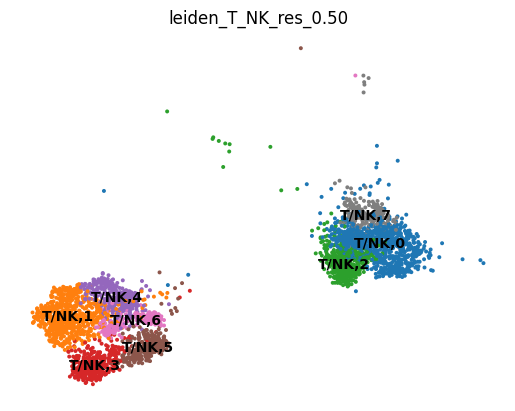

In [ ]:
sc.pl.umap(
    adata_t_nk,
    color= f"leiden_T_NK_res_{res:4.2f}",
    frameon=False,
    legend_loc="on data"
)

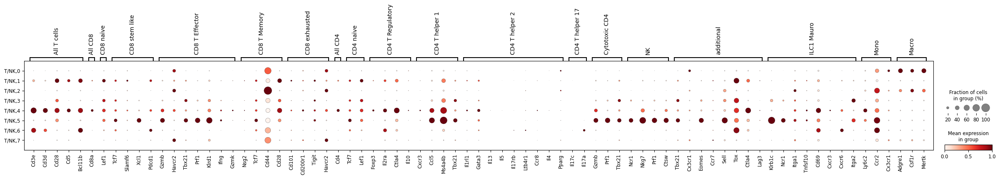

In [ ]:
# subset dict for CD8 T cells
cell_markers_dict_dotplot_cd8 = {k: v for k, v in cell_markers_dict_dotplot.items() if k in [
    'CD8 naïve', 'CD8 stem like', 'CD8 T Effector', 'CD8 T Memory', 'CD8 exhausted', 'All CD4 ',
    'CD4 naïve', 'CD4 T Regulatory', 'CD4 T helper 1', 'CD4 T helper 2', 'CD4 T helper 17',
    'Cytotoxic CD4', 'NK', 'All T cells', 'All CD8 '
]}

cell_markers_dict_dotplot_cd8['additional'] = [
    'Tbx21', 'Cx3cr1', 'Eomes', 'Ccr7',
    'Sell', 'Tox', 'Ctla4', 'Lag3'
]
cell_markers_dict_dotplot_cd8['ILC1'] = [
    "Klrb1c",
    "Ncr1",
    "Itga1",
    "Tnfsf10",
    "Cd69",
    "Cxcr3",
    "Cxcr6",
    "Itga2"
]

cell_markers_dict_dotplot_cd8['Mono'] = ["Ly6c2", "Ccr2", "Cx3cr1"]
cell_markers_dict_dotplot_cd8['Macro'] = ["Adgre1", "Csf1r", "Mertk"]

sc.pl.dotplot(
    adata_t_nk,
    cell_markers_dict_dotplot_cd8,
    groupby=f"leiden_T_NK_res_{res:4.2f}",
    standard_scale="var"
)

In [81]:
t_nk_subset_dict = {
    'T/NK,0': 'Mac/Mono',
    'T/NK,1': 'T cells',
    'T/NK,2': 'Mac/Mono',
    'T/NK,3': 'NK cells',
    'T/NK,4': 'T cells',
    'T/NK,5': 'NK cells',
    'T/NK,6': 'T cells',
    'T/NK,7': 'Mac/Mono',
}

adata_t_nk.obs['annotation_T_NK_fine'] = adata_t_nk.obs[f"leiden_T_NK_res_{res:4.2f}"].map(t_nk_subset_dict)

In [ ]:
adata.obs["annotation_T_NK_fine"] = adata.obs.index.map(
    dict(zip(adata_t_nk.obs.index, adata_t_nk.obs['annotation_T_NK_fine']))
)

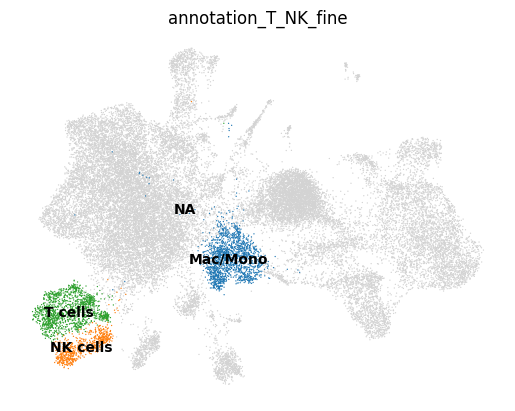

In [83]:
sc.pl.umap(
    adata,
    color= 'annotation_T_NK_fine',
    frameon=False,
    legend_loc="on data"
)

# Annotate T/NK more in detail

In [84]:
adata_t_nk = adata[adata.obs["annotation_T_NK_fine"].isin(["T cells", "NK cells"])].copy()
adata_t_nk

AnnData object with n_obs × n_vars = 2013 × 23676
    obs: 'library_id', 'sample_id', 'genotype', 'n_genes', 'doublet_score', 'predicted_doublet', 'n_counts', 'log1p_n_counts', 'log1p_n_genes', 'percent_hb', 'n_counts_hb', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_top50', 'cell_passed_qc', 'consensus_fraction', 'qc_cluster', 'cluster_passed_qc', 'consensus_passed_qc', 'cell_passed_qc_int', 'cluster_passed_qc_int', 'consensus_passed_qc_int', 'leiden_res_0.05', 'leiden_res_0.10', 'leiden_res_0.50', 'leiden_res_1.00', 'leiden_res_2.00', 'annotation_v1_subannot', 'annotation_DC_fine', 'myeloid_fine', 'DC_fine', 'annotation_T_NK_fine'
    var: 'ensembl_ids', 'gene_symbols', 'n_cells', 'hb', 'mito', 'ribo', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'library_id_colors', 'log1p', 'neighbors', 'pca', 'predicted_doublet_colors', 'qc_cluster_colors', 'sample

In [100]:
res=0.9
sc.tl.leiden(
    adata_t_nk, 
    resolution=res, 
    restrict_to=('annotation_T_NK_fine', ['T cells', 'NK cells']),
    key_added=f"leiden_T_NK_res_{res:4.2f}"
)

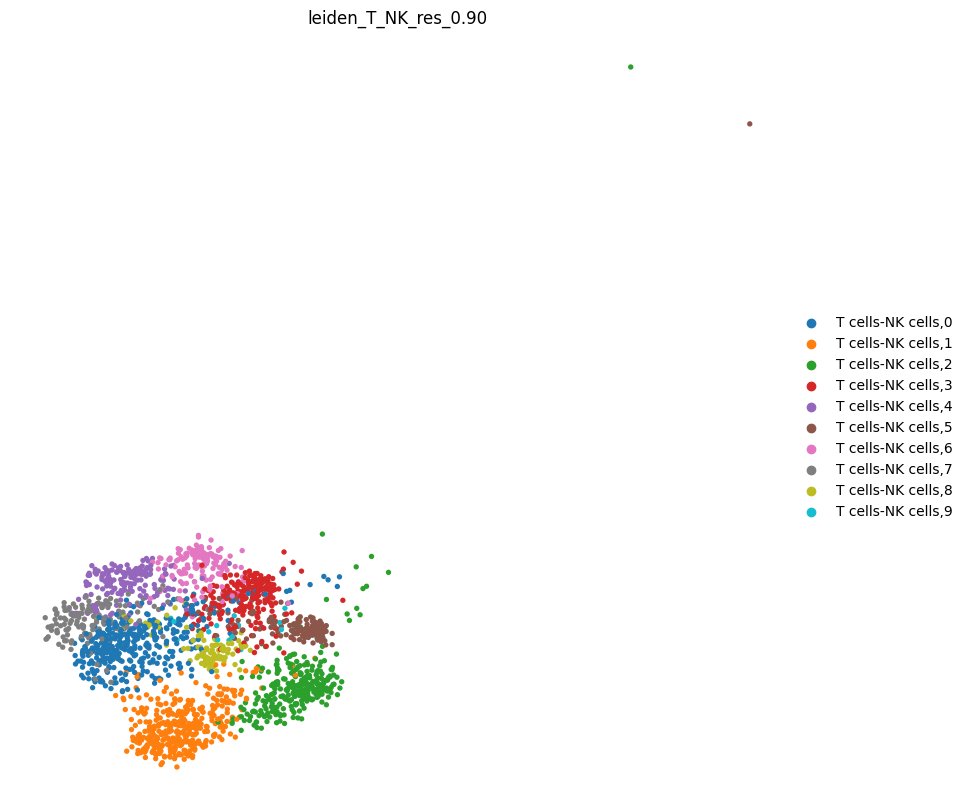

In [ ]:
with plt.rc_context({"figure.figsize": (10, 10)}):
    sc.pl.umap(
        adata_t_nk,
        color= f"leiden_T_NK_res_{res:4.2f}",
        frameon=False
    )

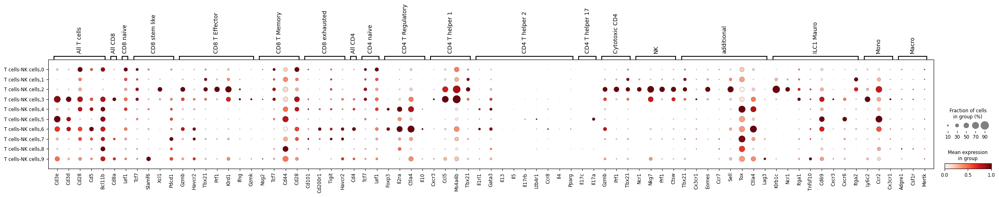

In [ ]:
# subset dict for CD8 T cells
cell_markers_dict_dotplot_cd8 = {k: v for k, v in cell_markers_dict_dotplot.items() if k in [
    'CD8 naïve', 'CD8 stem like', 'CD8 T Effector', 'CD8 T Memory', 'CD8 exhausted', 'All CD4 ',
    'CD4 naïve', 'CD4 T Regulatory', 'CD4 T helper 1', 'CD4 T helper 2', 'CD4 T helper 17',
    'Cytotoxic CD4', 'NK', 'All T cells', 'All CD8 '
]}
cell_markers_dict_dotplot_cd8['additional'] = ['Tbx21', 'Cx3cr1', 'Eomes', 'Ccr7', 'Sell', 'Tox', 'Ctla4', 'Lag3']
cell_markers_dict_dotplot_cd8['ILC1'] = [
    "Klrb1c",
    "Ncr1",
    "Itga1",
    "Tnfsf10",
    "Cd69",
    "Cxcr3",
    "Cxcr6",
    "Itga2"
]

cell_markers_dict_dotplot_cd8['Mono'] = ["Ly6c2", "Ccr2", "Cx3cr1"]
cell_markers_dict_dotplot_cd8['Macro'] = ["Adgre1", "Csf1r", "Mertk"]

sc.pl.dotplot(adata_t_nk, cell_markers_dict_dotplot_cd8, groupby=f"leiden_T_NK_res_{res:4.2f}", standard_scale="var")

In [105]:
sc.tl.rank_genes_groups(adata_t_nk, groupby=f"leiden_T_NK_res_{res:4.2f}", method="wilcoxon")
gene_groups = sc.get.rank_genes_groups_df(adata_t_nk, group = None)
gene_groups_subset = gene_groups.groupby("group").head(100)
gene_groups_subset.to_csv('./top_100_degs_per_cluster_T_NK_immunity_rev.csv')

/tmp/ipykernel_1374144/2323833214.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  gene_groups_subset = gene_groups.groupby("group").head(100)


In [106]:
t_nk_subset_dict = {
    'T cells-NK cells,0': 'Conventional CD4+ T cells',
    'T cells-NK cells,1': 'Conventional CD4+ T cells',
    'T cells-NK cells,2': 'NK cells',
    'T cells-NK cells,3': 'Naive/Stem-like or Transitory CD8+ T cells',
    'T cells-NK cells,4': 'Tregs',
    'T cells-NK cells,5': 'gamma/delta T cells',
    'T cells-NK cells,6': 'Tregs',
    'T cells-NK cells,7': 'Dysfunctional/Exhausted CD8+ T cells',
    'T cells-NK cells,8': 'iNKT cells',
    'T cells-NK cells,9': 'B cells'
}

adata_t_nk.obs['annotation_T_NK_fine'] = adata_t_nk.obs[f"leiden_T_NK_res_{res:4.2f}"].map(t_nk_subset_dict)

In [ ]:
adata.obs["annotation_T_NK_fine"] = adata.obs.index.map(
    dict(zip(adata_t_nk.obs.index, adata_t_nk.obs['annotation_T_NK_fine']))
)

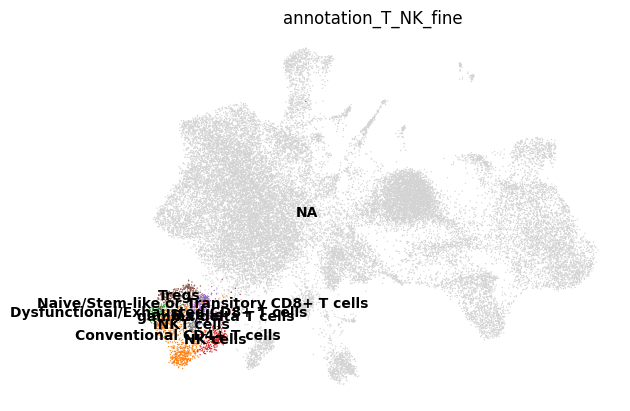

In [108]:
sc.pl.umap(
    adata,
    color= 'annotation_T_NK_fine',
    frameon=False,
    legend_loc="on data"
)

# Annotate Myeloid more in detail

In [27]:
adata_dc = adata[adata.obs["annotation_v1_subannot"] == "Myeloid"].copy()
adata_dc

AnnData object with n_obs × n_vars = 16647 × 23676
    obs: 'library_id', 'sample_id', 'genotype', 'n_genes', 'doublet_score', 'predicted_doublet', 'n_counts', 'log1p_n_counts', 'log1p_n_genes', 'percent_hb', 'n_counts_hb', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_top50', 'cell_passed_qc', 'consensus_fraction', 'qc_cluster', 'cluster_passed_qc', 'consensus_passed_qc', 'cell_passed_qc_int', 'cluster_passed_qc_int', 'consensus_passed_qc_int', 'leiden_res_0.05', 'leiden_res_0.10', 'leiden_res_0.50', 'leiden_res_1.00', 'leiden_res_2.00', 'annotation_v1_subannot'
    var: 'ensembl_ids', 'gene_symbols', 'n_cells', 'hb', 'mito', 'ribo', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'library_id_colors', 'log1p', 'neighbors', 'pca', 'predicted_doublet_colors', 'qc_cluster_colors', 'sample_id_colors', 'scautoqc_ranges', 'scrublet', 'umap', 'leiden_res_0.05', '

In [33]:
adata_dc.obs['annotation_v1_subannot'] = pd.Categorical(adata_dc.obs['annotation_v1_subannot'])

res=0.4
sc.tl.leiden(
    adata_dc, 
    resolution=res, 
    restrict_to=('annotation_v1_subannot', ['Myeloid']),
    key_added=f"leiden_DC_res_{res:4.2f}"
)

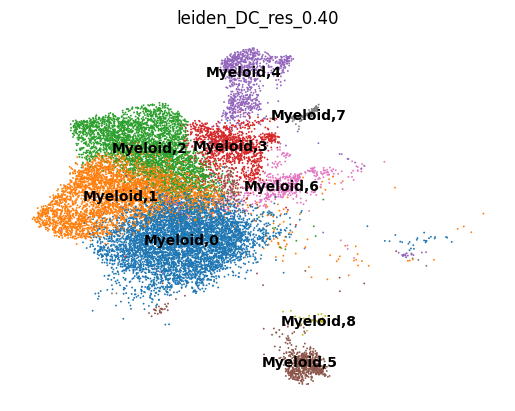

In [34]:
sc.pl.umap(
    adata_dc,
    color= f"leiden_DC_res_{res:4.2f}",
    frameon=False,
    legend_loc="on data"
)

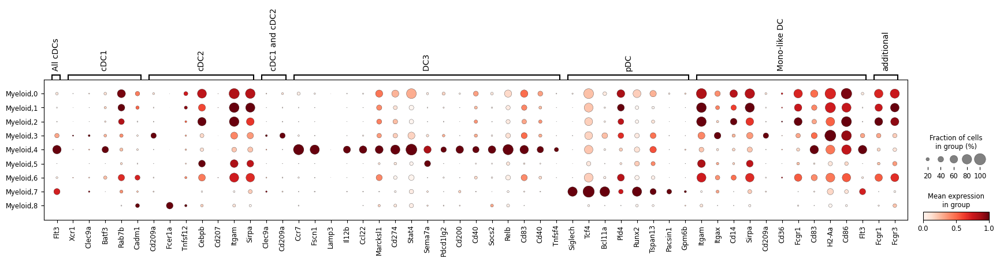

In [ ]:
cell_markers_dict_dotplot_dc = {k: v for k, v in cell_markers_dict_dotplot.items() if k in [
    'All cDCs', 'cDC1 ', 'cDC2', 'cDC1 and cDC2 ', 'DC3 ', 'pDC', 'Mono-like DC'
]}

cell_markers_dict_dotplot_dc["additional"] = ['Fcgr1', 'Fcgr3']

sc.pl.dotplot(adata_dc, cell_markers_dict_dotplot_dc, groupby=f"leiden_DC_res_{res:4.2f}", standard_scale="var")

In [37]:
dc_subset_dict = {
    'Myeloid,0': 'Mac/Mono',
    'Myeloid,1': 'Mac/Mono',
    'Myeloid,2': 'Mac/Mono',
    'Myeloid,3': 'DC',
    'Myeloid,4': 'DC',
    'Myeloid,5': 'Mac/Mono',
    'Myeloid,6': 'Mac/Mono',
    'Myeloid,7': 'DC',
    'Myeloid,8': 'Mac/Mono'
}

adata_dc.obs['myeloid_DC_fine'] = adata_dc.obs[f"leiden_DC_res_{res:4.2f}"].map(dc_subset_dict)

In [40]:
adata.obs["myeloid_fine"] = adata.obs.index.map(dict(zip(adata_dc.obs.index, adata_dc.obs['myeloid_DC_fine'])))

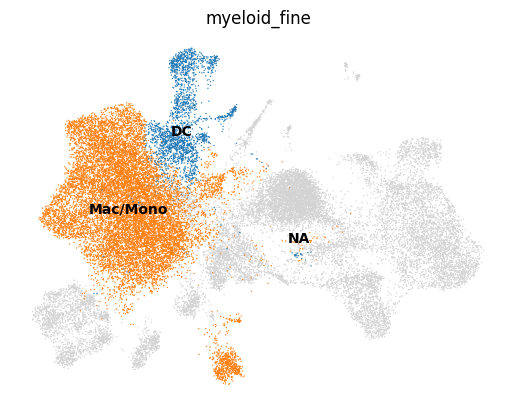

In [42]:
sc.pl.umap(
    adata,
    color= 'myeloid_fine',
    frameon=False,
    legend_loc="on data"
)

# Annotate DC more in detail

In [45]:
adata_dc = adata[adata.obs["myeloid_fine"] == "DC"].copy()
adata_dc

AnnData object with n_obs × n_vars = 2325 × 23676
    obs: 'library_id', 'sample_id', 'genotype', 'n_genes', 'doublet_score', 'predicted_doublet', 'n_counts', 'log1p_n_counts', 'log1p_n_genes', 'percent_hb', 'n_counts_hb', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_top50', 'cell_passed_qc', 'consensus_fraction', 'qc_cluster', 'cluster_passed_qc', 'consensus_passed_qc', 'cell_passed_qc_int', 'cluster_passed_qc_int', 'consensus_passed_qc_int', 'leiden_res_0.05', 'leiden_res_0.10', 'leiden_res_0.50', 'leiden_res_1.00', 'leiden_res_2.00', 'annotation_v1_subannot', 'annotation_DC_fine', 'myeloid_fine'
    var: 'ensembl_ids', 'gene_symbols', 'n_cells', 'hb', 'mito', 'ribo', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'library_id_colors', 'log1p', 'neighbors', 'pca', 'predicted_doublet_colors', 'qc_cluster_colors', 'sample_id_colors', 'scautoqc_ranges', 'sc

In [67]:
adata_dc.obs['myeloid_fine'] = pd.Categorical(adata_dc.obs['myeloid_fine'])

res=0.5
sc.tl.leiden(
    adata_dc, 
    resolution=res, 
    restrict_to=('myeloid_fine', ['DC']),
    key_added=f"leiden_DC_res_{res:4.2f}"
)

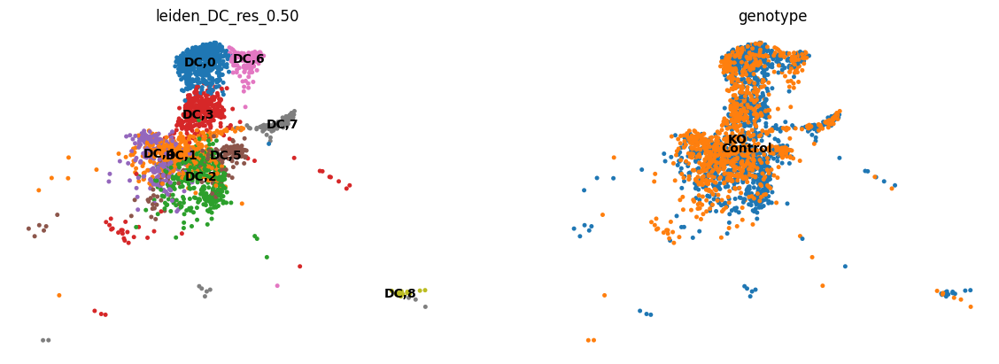

In [68]:
sc.pl.umap(
    adata_dc,
    color= [f"leiden_DC_res_{res:4.2f}", "genotype"],
    frameon=False,
    legend_loc="on data"
)

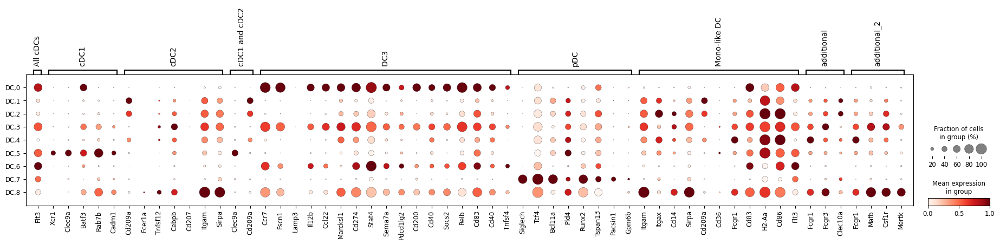

In [ ]:
cell_markers_dict_dotplot_dc = {k: v for k, v in cell_markers_dict_dotplot.items() if k in [
    'All cDCs', 'cDC1 ', 'cDC2', 'cDC1 and cDC2 ', 'DC3 ', 'pDC', 'Mono-like DC'
]}

cell_markers_dict_dotplot_dc["additional"] = ['Fcgr1', 'Fcgr3', 'Clec10a']


cell_markers_dict_dotplot_dc["additional_2"] = ['Fcgr1', 'Mafb', 'Csf1r', 'Mertk']

sc.pl.dotplot(adata_dc, cell_markers_dict_dotplot_dc, groupby=f"leiden_DC_res_{res:4.2f}", standard_scale="var")

In [70]:
dc_subset_dict = {
    'DC,0': 'CCR7+ DCs',
    'DC,1': 'cDC2s',
    'DC,2': 'cDC2s',
    'DC,3': 'CCR7+ DCs',
    'DC,4': 'cDC2s/Mono/Mac',
    'DC,5': 'cDC1s',
    'DC,6': 'CCR7+ DCs',
    'DC,7': 'pDCs',
    'DC,8': 'CCR7+ DCs of monocyte-origin?'
}

adata_dc.obs['DC_fine'] = adata_dc.obs[f"leiden_DC_res_{res:4.2f}"].map(dc_subset_dict)

In [71]:
adata.obs["DC_fine"] = adata.obs.index.map(dict(zip(adata_dc.obs.index, adata_dc.obs['DC_fine'])))

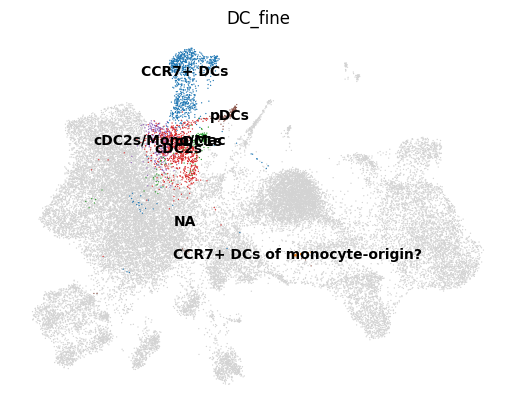

In [72]:
sc.pl.umap(
    adata,
    color= 'DC_fine',
    frameon=False,
    legend_loc="on data"
)

In [121]:
adata.obs["annotation_v1_subannot"] = adata.obs["annotation_v1_subannot"].astype("category")

union_cats = (
    adata.obs["DC_fine"].cat.categories
    .union(adata.obs["annotation_T_NK_fine"].cat.categories)
    .union(adata.obs["annotation_v1_subannot"].cat.categories)
)

adata.obs["DC_fine"] = adata.obs["DC_fine"].cat.set_categories(union_cats)
adata.obs["annotation_T_NK_fine"] = adata.obs["annotation_T_NK_fine"].cat.set_categories(union_cats)
adata.obs["annotation_v1_subannot"] = adata.obs["annotation_v1_subannot"].cat.set_categories(union_cats)

adata.obs["annotation_v2"] = (
    adata.obs["DC_fine"]
    .fillna(adata.obs["annotation_T_NK_fine"])
    .fillna(adata.obs["annotation_v1_subannot"])
)

In [123]:
adata.obs["annotation_v2"] = adata.obs["annotation_v2"].replace("T/NK", "Myeloid")
adata.obs["annotation_v2"] = adata.obs["annotation_v2"].replace("Neutrophils", "Myeloid")

/tmp/ipykernel_1374144/1240400703.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs["annotation_v2"] = adata.obs["annotation_v2"].replace("T/NK", "Myeloid")
/tmp/ipykernel_1374144/1240400703.py:2: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs["annotation_v2"] = adata.obs["annotation_v2"].replace("Neutrophils", "Myeloid")


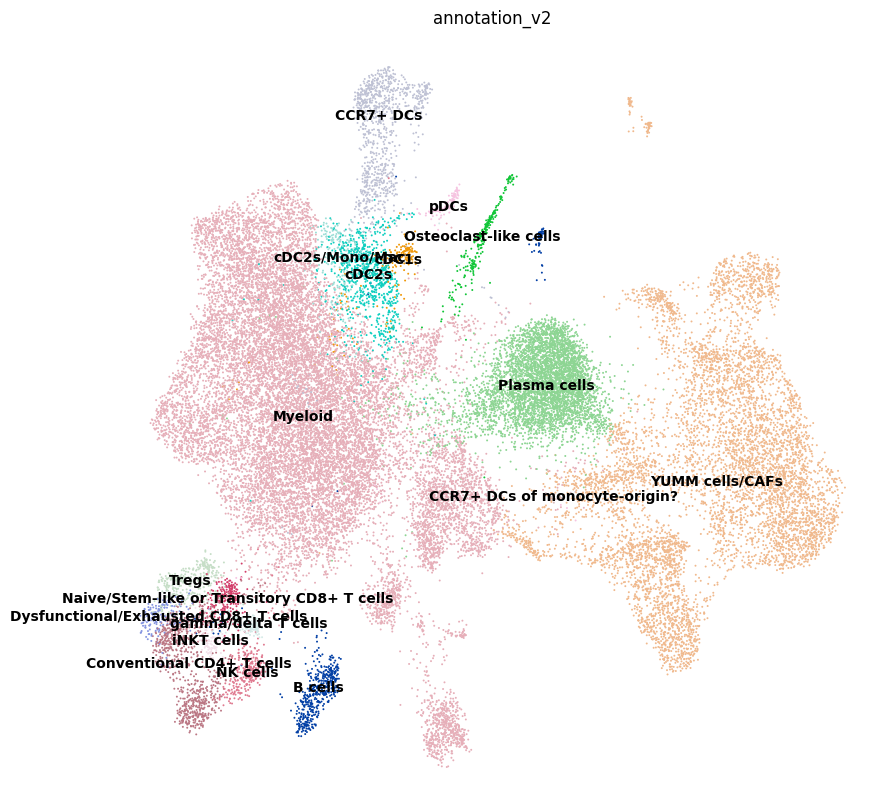

In [124]:
with plt.rc_context({"figure.figsize": (10, 10)}):
    sc.pl.umap(
        adata,
        color= 'annotation_v2',
        frameon=False,
        legend_loc="on data",
        size=8
    )

# Check subclusters of Mac/mono

In [125]:
adata_mac_mono = adata[adata.obs["annotation_v2"] == "Myeloid"].copy()
adata_mac_mono

AnnData object with n_obs × n_vars = 16820 × 23676
    obs: 'library_id', 'sample_id', 'genotype', 'n_genes', 'doublet_score', 'predicted_doublet', 'n_counts', 'log1p_n_counts', 'log1p_n_genes', 'percent_hb', 'n_counts_hb', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_top50', 'cell_passed_qc', 'consensus_fraction', 'qc_cluster', 'cluster_passed_qc', 'consensus_passed_qc', 'cell_passed_qc_int', 'cluster_passed_qc_int', 'consensus_passed_qc_int', 'leiden_res_0.05', 'leiden_res_0.10', 'leiden_res_0.50', 'leiden_res_1.00', 'leiden_res_2.00', 'annotation_v1_subannot', 'annotation_DC_fine', 'myeloid_fine', 'DC_fine', 'annotation_T_NK_fine', 'annotation_v2'
    var: 'ensembl_ids', 'gene_symbols', 'n_cells', 'hb', 'mito', 'ribo', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'library_id_colors', 'log1p', 'neighbors', 'pca', 'predicted_doublet_colors', 'qc_cluste

In [154]:
res=0.5
sc.tl.leiden(
    adata_mac_mono, 
    resolution=res, 
    restrict_to=('annotation_v2', ['Myeloid']),
    key_added=f"leiden_MacMono_res_{res:4.2f}"
)

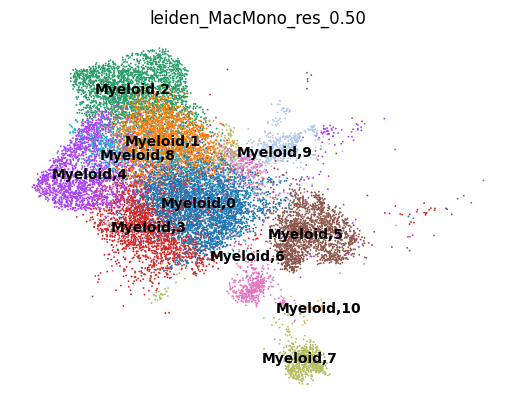

In [155]:
sc.pl.umap(
    adata_mac_mono,
    color= f"leiden_MacMono_res_{res:4.2f}",
    frameon=False,
    legend_loc="on data"
)

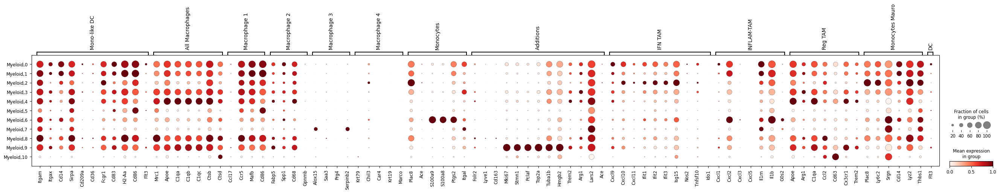

In [156]:
cell_markers_dict_dotplot_mac_mono = {k: v for k, v in cell_markers_dict_dotplot.items() if k in [
    "All Macrophages ",
    "Macrophage 1",
    "Macrophage 2",
    "Macrophage 3",
    "Macrophage 4",
    "Monocytes",
    "Additions",
    "IFN TAM",
    "INFLAM-TAM",
    "Reg TAM",
    'Mono-like DC',
    "Monocytes Mauro"]
}

cell_markers_dict_dotplot_mac_mono["DC"] = "Flt3"

sc.pl.dotplot(adata_mac_mono, cell_markers_dict_dotplot_mac_mono, groupby=f"leiden_MacMono_res_{res:4.2f}", standard_scale="var")

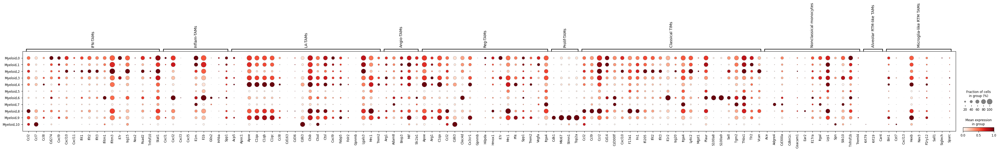

In [157]:
sc.pl.dotplot(adata_mac_mono, tam_marker_genes_dict_dotplot, groupby=f"leiden_MacMono_res_{res:4.2f}", standard_scale="var")

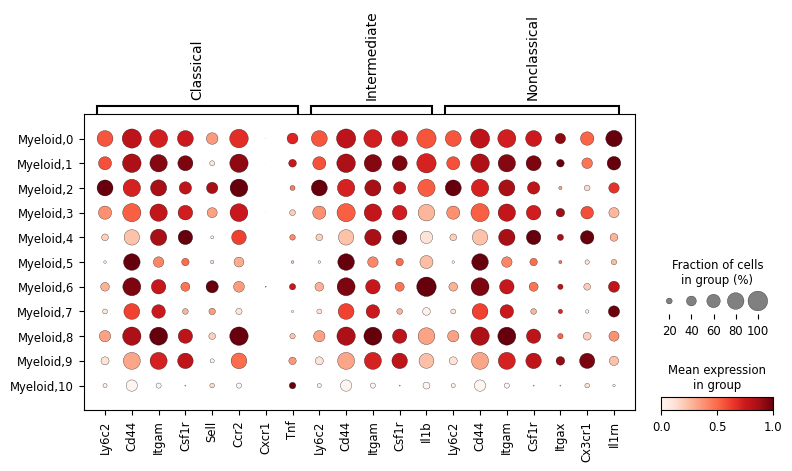

In [158]:
sc.pl.dotplot(adata_mac_mono, monocytes_marker_genes_dict_dotplot, groupby=f"leiden_MacMono_res_{res:4.2f}", standard_scale="var")

In [159]:
sc.tl.rank_genes_groups(adata_mac_mono, groupby=f"leiden_MacMono_res_{res:4.2f}", method="wilcoxon")
gene_groups = sc.get.rank_genes_groups_df(adata_mac_mono, group = None)
gene_groups_subset = gene_groups.groupby("group").head(100)
gene_groups_subset.to_csv('./top_100_degs_per_cluster_MacMono_immunity_rev.csv')

/tmp/ipykernel_1374144/469362402.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  gene_groups_subset = gene_groups.groupby("group").head(100)


In [160]:
macmono_subset_dict = {
    'Myeloid,0': 'Tregs/Conventional CD4+ T cells',
    'Myeloid,1': 'Classical Monocytes',
    'Myeloid,2': 'IFN-TAMs',
    'Myeloid,3': 'CD8+ T cells',
    'Myeloid,4': 'Reg-TAMs',
    'Myeloid,5': 'cDC2s ?',
    'Myeloid,6': 'Neutrophils',
    'Myeloid,7': 'Non-classical Monocytes',
    'Myeloid,8': 'LA-TAMs',
    'Myeloid,9': 'Prolif-TAMs',
    'Myeloid,10': 'Mast cells'

}

adata_mac_mono.obs['annotation_MacMono_fine'] = adata_mac_mono.obs[f"leiden_MacMono_res_{res:4.2f}"].map(macmono_subset_dict)

In [ ]:
adata.obs["annotation_MacMono_fine"] = adata.obs.index.map(
    dict(zip(adata_mac_mono.obs.index, adata_mac_mono.obs['annotation_MacMono_fine']))
)

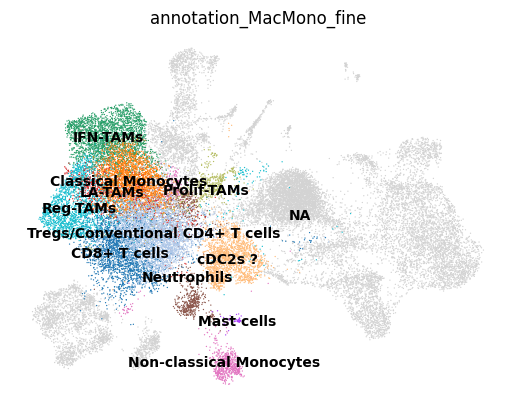

In [162]:
sc.pl.umap(
    adata,
    color= 'annotation_MacMono_fine',
    frameon=False,
    legend_loc="on data"
)

In [163]:
adata.obs["annotation_v2"] = adata.obs["annotation_v2"].astype("category")

union_cats = (
    adata.obs["annotation_v2"].cat.categories
    .union(adata.obs["annotation_MacMono_fine"].cat.categories)
)

adata.obs["annotation_v2"] = adata.obs["annotation_v2"].cat.set_categories(union_cats)
adata.obs["annotation_MacMono_fine"] = adata.obs["annotation_MacMono_fine"].cat.set_categories(union_cats)

adata.obs["annotation_v3"] = (
    adata.obs["annotation_MacMono_fine"]
    .fillna(adata.obs["annotation_v2"])
)

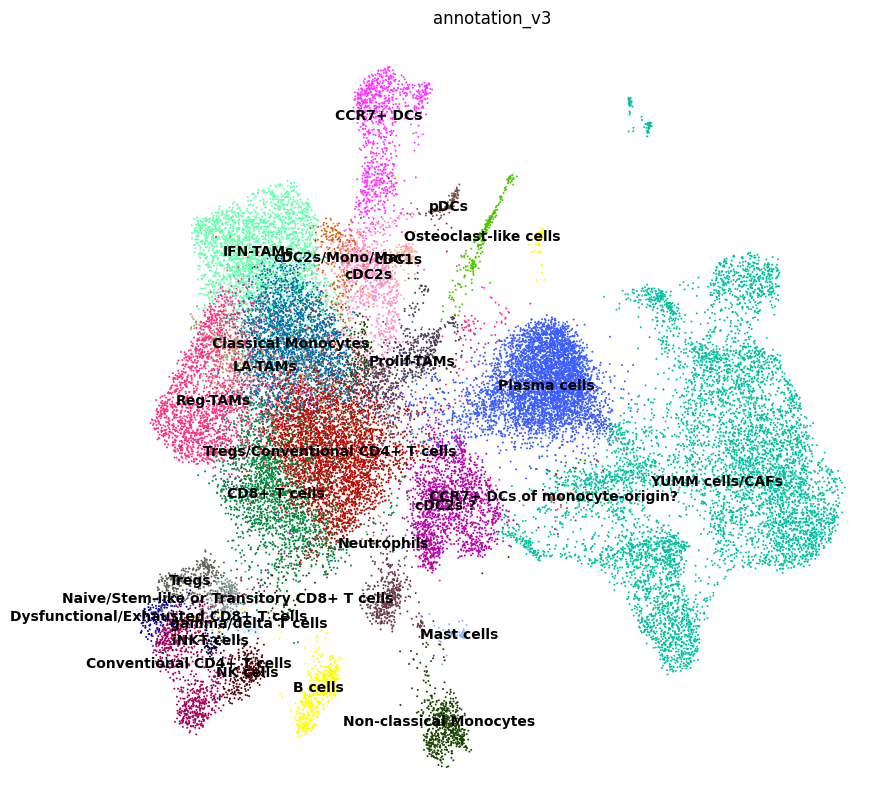

In [164]:
with plt.rc_context({"figure.figsize": (10, 10)}):
    sc.pl.umap(
        adata,
        color= 'annotation_v3',
        frameon=False,
        legend_loc="on data",
        size=8
    )

In [167]:
adata.obs["annotation_v3"] = adata.obs["annotation_v3"].astype(str).astype("category")
adata.obs["annotation_v3"].value_counts(dropna=False)

annotation_v3
YUMM cells/CAFs                               6987
Plasma cells                                  4767
Tregs/Conventional CD4+ T cells               3374
Classical Monocytes                           2508
IFN-TAMs                                      2284
CD8+ T cells                                  2058
Reg-TAMs                                      1998
cDC2s ?                                       1674
CCR7+ DCs                                      946
cDC2s                                          862
Neutrophils                                    827
Non-classical Monocytes                        771
Conventional CD4+ T cells                      766
LA-TAMs                                        746
B cells                                        533
Prolif-TAMs                                    532
Tregs                                          316
NK cells                                       297
Osteoclast-like cells                          246
Naive/Stem-like o

In [168]:
sc.tl.rank_genes_groups(adata, groupby="annotation_v3", method="wilcoxon")
gene_groups = sc.get.rank_genes_groups_df(adata, group = None)
gene_groups_subset = gene_groups.groupby("group").head(100)
gene_groups_subset.to_csv('./top_100_degs_per_cluster_annot_v3_immunity_rev.csv')

/home/icb/raphael.kfuri-rubens/miniforge-pypy3/envs/yumm-env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:429: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/icb/raphael.kfuri-rubens/miniforge-pypy3/envs/yumm-env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:431: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/icb/raphael.kfuri-rubens/miniforge-pypy3/envs/yumm-en

In [ ]:
cell_types = {
    "YUMM cells/CAFs": "YUMM cells/CAFs",
    "Plasma cells": "Fibroblast-plasma cell-macrophage mixed cluster",
    "Tregs/Conventional CD4+ T cells": "Classical Monocytes-1",
    "Classical Monocytes": "Classical Monocytes-2",
    "IFN-TAMs": "Classical Monocytes-3",
    "CD8+ T cells": "CD4+ T cells with myeloid contamination",
    "Reg-TAMs": "Reg-TAMs",
    "cDC2s ?": "moDCs",
    "CCR7+ DCs": "CCR7+ DCs (cDC1-like)",
    "cDC2s": "cDC2s",
    "Neutrophils": "Neutrophils",
    "Non-classical Monocytes": "LA-TAMs",
    "Conventional CD4+ T cells": "Conventional CD4+ T cells",
    "LA-TAMs": "Reg-TAMs",
    "B cells": "B cells",
    "Prolif-TAMs": "Prolif-TAMs",
    "Tregs": "Tregs",
    "NK cells": "NK cells",
    "Osteoclast-like cells": "Osteoclast-like cells",
    "Naive/Stem-like or Transitory CD8+ T cells": "CD8+ T Cells",
    "cDC2s/Mono/Mac": "IFN-TAMs",
    "cDC1s": "cDC1s",
    "gamma/delta T cells": "gamma/delta T cells",
    "Dysfunctional/Exhausted CD8+ T cells": "Conventional CD4+ T cells",
    "pDCs": "pDCs",
    "iNKT cells": "iNKT cells",
    "Mast cells": "Mast cells",
    "CCR7+ DCs of monocyte-origin?": "CCR7+ DCs (cDC2-like)"
}

adata.obs["annotation_v4"] = adata.obs["annotation_v3"].map(cell_types)

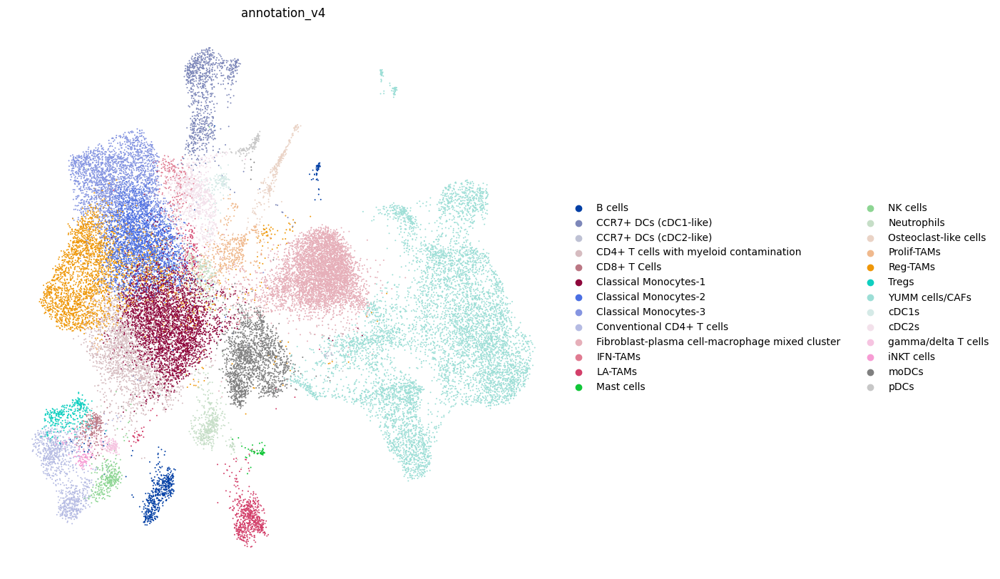

In [ ]:
with plt.rc_context({"figure.figsize": (10, 10)}):
    sc.pl.umap(
        adata,
        color= 'annotation_v4',
        frameon=False,
        size=8
    )

# Separate B cell cluster

In [3]:
adata_b = adata[adata.obs["annotation_v2"] == "B cells"].copy()
adata_b

AnnData object with n_obs × n_vars = 533 × 23676
    obs: 'library_id', 'sample_id', 'genotype', 'n_genes', 'doublet_score', 'predicted_doublet', 'n_counts', 'log1p_n_counts', 'log1p_n_genes', 'percent_hb', 'n_counts_hb', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_top50', 'cell_passed_qc', 'consensus_fraction', 'qc_cluster', 'cluster_passed_qc', 'consensus_passed_qc', 'cell_passed_qc_int', 'cluster_passed_qc_int', 'consensus_passed_qc_int', 'leiden_res_0.05', 'leiden_res_0.10', 'leiden_res_0.50', 'leiden_res_1.00', 'leiden_res_2.00', 'annotation_v1_subannot', 'annotation_DC_fine', 'myeloid_fine', 'DC_fine', 'annotation_T_NK_fine', 'annotation_v2', 'annotation_MacMono_fine', 'annotation_v3', 'annotation_v4'
    var: 'ensembl_ids', 'gene_symbols', 'n_cells', 'hb', 'mito', 'ribo', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'annotation_v4_colors', 'genotype_co

In [4]:
res=0.1
sc.tl.leiden(
    adata_b, 
    resolution=res, 
    restrict_to=('annotation_v4', ['B cells']),
    key_added=f"leiden_b_res_{res:4.2f}"
)

/tmp/ipykernel_3459569/363239093.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(


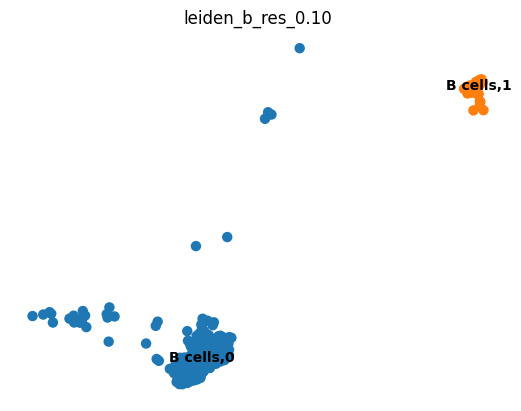

In [5]:
sc.pl.umap(
    adata_b,
    color= f"leiden_b_res_{res:4.2f}",
    frameon=False,
    legend_loc="on data"
)

In [6]:
sc.tl.rank_genes_groups(adata_b, groupby=f"leiden_b_res_{res:4.2f}", method="wilcoxon")
gene_groups = sc.get.rank_genes_groups_df(adata_b, group = None)
gene_groups_subset = gene_groups.groupby("group").head(100)
gene_groups_subset.to_csv('./top_100_degs_per_cluster_b_sep_immunity_rev.csv')

/tmp/ipykernel_3459569/3138268609.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  gene_groups_subset = gene_groups.groupby("group").head(100)


In [7]:
b_subset_dict = {
    'B cells,0': 'B cells',
    'B cells,1': '??? (Plasma cells)'

}

adata_b.obs['annotation_b_sep'] = adata_b.obs[f"leiden_b_res_{res:4.2f}"].map(b_subset_dict)

In [ ]:
adata.obs["annotation_b_sep"] = adata.obs.index.map(
    dict(zip(adata_b.obs.index, adata_b.obs['annotation_b_sep']))
)

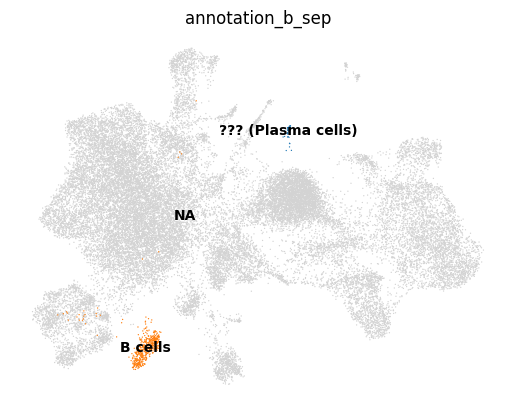

In [9]:
sc.pl.umap(
    adata,
    color= 'annotation_b_sep',
    frameon=False,
    legend_loc="on data"
)

In [10]:
adata.obs["annotation_v4"] = adata.obs["annotation_v4"].astype("category")

union_cats = (
    adata.obs["annotation_v4"].cat.categories
    .union(adata.obs["annotation_b_sep"].cat.categories)
)

adata.obs["annotation_v4"] = adata.obs["annotation_v4"].cat.set_categories(union_cats)
adata.obs["annotation_b_sep"] = adata.obs["annotation_b_sep"].cat.set_categories(union_cats)

adata.obs["annotation_v5"] = (
    adata.obs["annotation_b_sep"]
    .fillna(adata.obs["annotation_v4"])
)

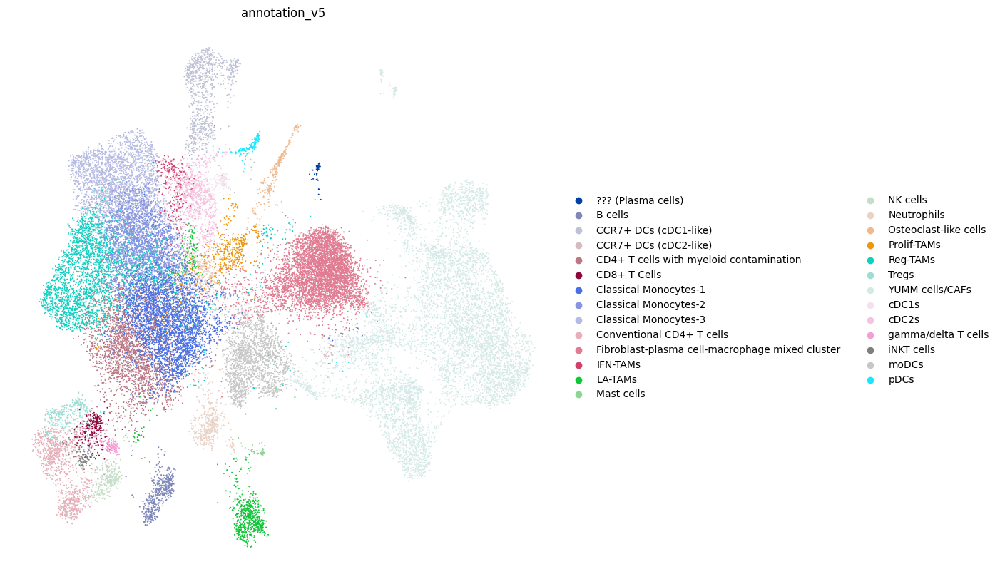

In [11]:
with plt.rc_context({"figure.figsize": (10, 10)}):
    sc.pl.umap(
        adata,
        color= 'annotation_v5',
        frameon=False,
        size=8
    )

In [12]:
adata.write_h5ad("/home/icb/raphael.kfuri-rubens/data/yumm_analysis/anndata_files/immunity_dc_revision_annotation_v5.h5ad")

In [4]:
adata.obs["annotation_v5"].value_counts(dropna=False)

annotation_v5
YUMM cells/CAFs                                    6987
Fibroblast-plasma cell-macrophage mixed cluster    4767
Classical Monocytes-1                              3374
Reg-TAMs                                           2744
Classical Monocytes-2                              2508
Classical Monocytes-3                              2284
CD4+ T cells with myeloid contamination            2058
moDCs                                              1674
CCR7+ DCs (cDC1-like)                               946
Conventional CD4+ T cells                           913
cDC2s                                               862
Neutrophils                                         827
LA-TAMs                                             771
Prolif-TAMs                                         532
B cells                                             486
Tregs                                               316
NK cells                                            297
Osteoclast-like cells             

In [5]:
cell_types_to_keep = [
    "Classical Monocytes-1",
    "Classical Monocytes-2",
    "Classical Monocytes-3",
    "Reg-TAMs",
    "CD4+ T cells with myeloid contamination",
    "Prolif-TAMs",
    "IFN-TAMs"
]

adata = adata[adata.obs["annotation_v5"].isin(cell_types_to_keep)].copy()
adata

AnnData object with n_obs × n_vars = 13714 × 23676
    obs: 'library_id', 'sample_id', 'genotype', 'n_genes', 'doublet_score', 'predicted_doublet', 'n_counts', 'log1p_n_counts', 'log1p_n_genes', 'percent_hb', 'n_counts_hb', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_top50', 'cell_passed_qc', 'consensus_fraction', 'qc_cluster', 'cluster_passed_qc', 'consensus_passed_qc', 'cell_passed_qc_int', 'cluster_passed_qc_int', 'consensus_passed_qc_int', 'leiden_res_0.05', 'leiden_res_0.10', 'leiden_res_0.50', 'leiden_res_1.00', 'leiden_res_2.00', 'annotation_v1_subannot', 'annotation_DC_fine', 'myeloid_fine', 'DC_fine', 'annotation_T_NK_fine', 'annotation_v2', 'annotation_MacMono_fine', 'annotation_v3', 'annotation_v4', 'annotation_b_sep', 'annotation_v5'
    var: 'ensembl_ids', 'gene_symbols', 'n_cells', 'hb', 'mito', 'ribo', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    un

In [6]:
adata.obs["annotation_v5"].value_counts(dropna=False)

annotation_v5
Classical Monocytes-1                      3374
Reg-TAMs                                   2744
Classical Monocytes-2                      2508
Classical Monocytes-3                      2284
CD4+ T cells with myeloid contamination    2058
Prolif-TAMs                                 532
IFN-TAMs                                    214
Name: count, dtype: int64

In [7]:
sc.tl.rank_genes_groups(adata, groupby="annotation_v5", method="wilcoxon")
gene_groups = sc.get.rank_genes_groups_df(adata, group = None)
gene_groups_subset = gene_groups.groupby("group").head(100)
gene_groups_subset.to_csv('./top_100_degs_per_mono_macs_immunity_rev.csv')

/tmp/ipykernel_4190598/3677620611.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  gene_groups_subset = gene_groups.groupby("group").head(100)


# Annotation v6 revision

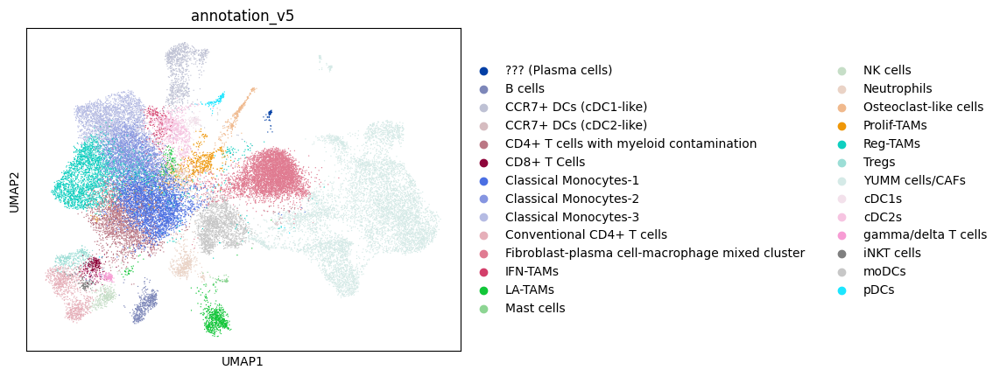

In [33]:
sc.pl.umap(adata, color="annotation_v5")

In [34]:
adata.obs["annotation_v5"].value_counts(dropna=False)

annotation_v5
YUMM cells/CAFs                                    6987
Fibroblast-plasma cell-macrophage mixed cluster    4767
Classical Monocytes-1                              3374
Reg-TAMs                                           2744
Classical Monocytes-2                              2508
Classical Monocytes-3                              2284
CD4+ T cells with myeloid contamination            2058
moDCs                                              1674
CCR7+ DCs (cDC1-like)                               946
Conventional CD4+ T cells                           913
cDC2s                                               862
Neutrophils                                         827
LA-TAMs                                             771
Prolif-TAMs                                         532
B cells                                             486
Tregs                                               316
NK cells                                            297
Osteoclast-like cells             

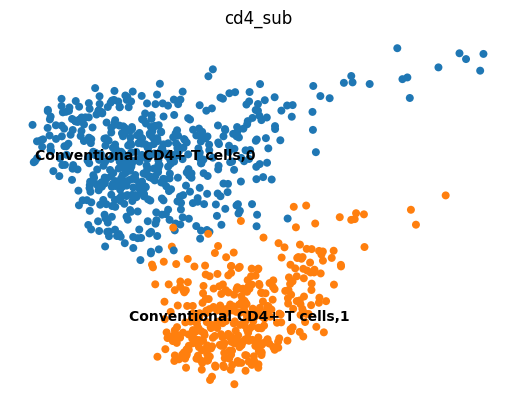

In [35]:
adata_cd4 = adata[adata.obs["annotation_v5"] == "Conventional CD4+ T cells"].copy()

res=0.2

sc.tl.leiden(
    adata_cd4, 
    resolution=res, 
    restrict_to=('annotation_v5', ['Conventional CD4+ T cells']),
    key_added="cd4_sub"
)
sc.pl.umap(
    adata_cd4,
    color= "cd4_sub",
    frameon=False,
    legend_loc="on data"
)

In [36]:
cd4_subset_dict = {
    'Conventional CD4+ T cells,0': 'Conventional CD4+ T cells',
    'Conventional CD4+ T cells,1': 'NK cells'
}

adata_cd4.obs['cd4_sub_final'] = adata_cd4.obs["cd4_sub"].map(cd4_subset_dict)

adata.obs["annotation_v6"] = adata.obs.index.map(dict(zip(adata_cd4.obs.index, adata_cd4.obs['cd4_sub_final'])))

In [37]:
adata.obs["annotation_v6"] = adata.obs["annotation_v6"].fillna(adata.obs["annotation_v5"].astype(str))

adata.obs["annotation_v6"].value_counts(dropna=False)

annotation_v6
YUMM cells/CAFs                                    6987
Fibroblast-plasma cell-macrophage mixed cluster    4767
Classical Monocytes-1                              3374
Reg-TAMs                                           2744
Classical Monocytes-2                              2508
Classical Monocytes-3                              2284
CD4+ T cells with myeloid contamination            2058
moDCs                                              1674
CCR7+ DCs (cDC1-like)                               946
cDC2s                                               862
Neutrophils                                         827
LA-TAMs                                             771
NK cells                                            670
Conventional CD4+ T cells                           540
Prolif-TAMs                                         532
B cells                                             486
Tregs                                               316
Osteoclast-like cells             

In [38]:
adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("CCR7+ DCs (cDC1-like)", "CCR7+ DCs")
adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("CCR7+ DCs (cDC2-like)", "Non-immune cells")
adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("Fibroblast-plasma cell-macrophage mixed cluster", "Non-immune cells")
adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("YUMM cells/CAFs", "Non-immune cells")
adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("??? (Plasma cells)", "Plasma cells")
adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("LA-TAMs", "Eosinophils")
adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("IFN-TAMs", "ISG15+ Monocytes")
adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("Classical Monocytes-1", "Inflam-TAMs")
adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("Classical Monocytes-2", "Mono-DCs")
adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("Classical Monocytes-3", "Classical Monocytes")
adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("CD4+ T cells with myeloid contamination", "LA-TAMs")
adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("moDCs", "Tissue-resident TAMs")

In [39]:
adata.obs["annotation_v6"].value_counts(dropna=False)

annotation_v6
Non-immune cells             11771
Inflam-TAMs                   3374
Reg-TAMs                      2744
Mono-DCs                      2508
Classical Monocytes           2284
LA-TAMs                       2058
Tissue-resident TAMs          1674
CCR7+ DCs                      946
cDC2s                          862
Neutrophils                    827
Eosinophils                    771
NK cells                       670
Conventional CD4+ T cells      540
Prolif-TAMs                    532
B cells                        486
Tregs                          316
Osteoclast-like cells          246
CD8+ T Cells                   220
ISG15+ Monocytes               214
cDC1s                          171
gamma/delta T cells            151
pDCs                           115
iNKT cells                      98
Mast cells                      48
Plasma cells                    47
Name: count, dtype: int64

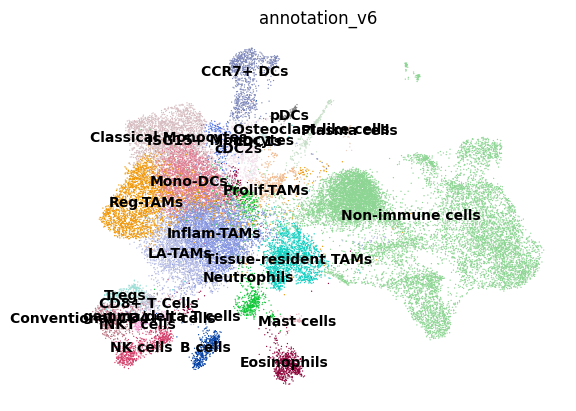

In [40]:
sc.pl.umap(
    adata,
    color= 'annotation_v6',
    frameon=False,
    legend_loc="on data"
)

In [41]:
adata.write_h5ad("/home/icb/raphael.kfuri-rubens/data/yumm_analysis/anndata_files/immunity_dc_revision_annotation_v6.h5ad")

In [3]:
adata.obs["annotation_v6"].value_counts(dropna=False)

annotation_v6
Non-immune cells             11771
Inflam-TAMs                   3374
Reg-TAMs                      2744
Mono-DCs                      2508
Classical Monocytes           2284
LA-TAMs                       2058
Tissue-resident TAMs          1674
CCR7+ DCs                      946
cDC2s                          862
Neutrophils                    827
Eosinophils                    771
NK cells                       670
Conventional CD4+ T cells      540
Prolif-TAMs                    532
B cells                        486
Tregs                          316
Osteoclast-like cells          246
CD8+ T Cells                   220
ISG15+ Monocytes               214
cDC1s                          171
gamma/delta T cells            151
pDCs                           115
iNKT cells                      98
Mast cells                      48
Plasma cells                    47
Name: count, dtype: int64

/tmp/ipykernel_2374966/3024382336.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("Osteoclast-like cells", "Osteoclast-like giant cells")
/tmp/ipykernel_2374966/3024382336.py:2: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("Mast cells", "Basophils/Mast cells")
/tmp/ipykernel_2374966/3024382336.py:3: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace 

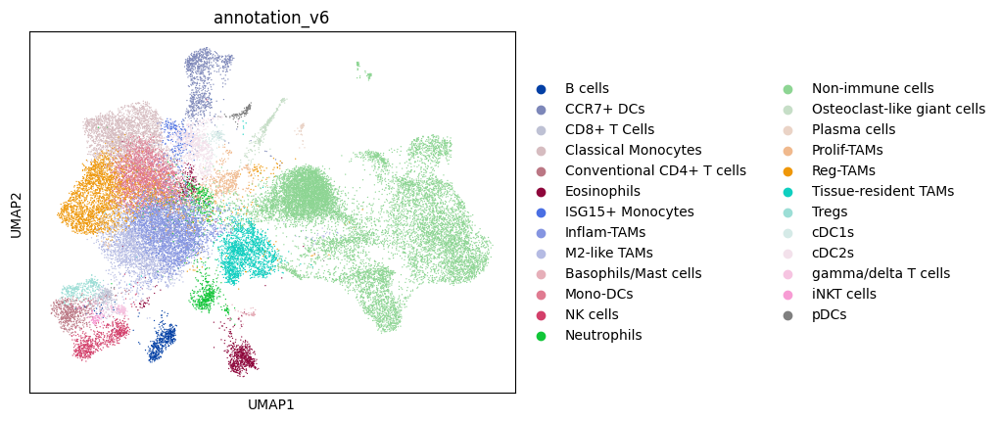

In [4]:
adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("Osteoclast-like cells", "Osteoclast-like giant cells")
adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("Mast cells", "Basophils/Mast cells")
adata.obs["annotation_v6"] = adata.obs["annotation_v6"].replace("LA-TAMs", "M2-like TAMs")

sc.pl.umap(adata, color="annotation_v6")

In [5]:
adata.write_h5ad("/home/icb/raphael.kfuri-rubens/data/yumm_analysis/anndata_files/immunity_dc_revision_annotation_v6.h5ad")